In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms
import time
import copy
import matplotlib.pyplot as plt

Load Training Data ~ 300 images

Defining custom class for xception model

In [6]:
class Xception_Net(nn.Module):
    def __init__(
        self,
        num_classes: int = 2,
    ) -> None:
        super(Xception_Net, self).__init__()
        
        #Entry flow layer 1
        self.entry_flow_1 = nn.Sequential(
            #input channels for images is 3
            nn.Conv2d(3, 32, kernel_size = (3, 3), stride = (2, 2), padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace = True),
            
            nn.Conv2d(32, 64, kernel_size = (3, 3), padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True)
        )
        
        #Entry flow layer 2 - Separable convolution layer
        self.entry_flow_2_sep_conv = nn.Sequential(
            #performing depthwise and pointwise convolutions
            nn.Conv2d(64, 128, kernel_size = (3, 3), padding=1),
            nn.Conv2d(128, 128, kernel_size = (1, 1)),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            
            nn.Conv2d(128, 128, kernel_size = (3, 3), padding=1),
            nn.Conv2d(128, 128, kernel_size = (1, 1)),
            nn.BatchNorm2d(128),
            nn.MaxPool2d(kernel_size = (3, 3), stride = (2, 2), padding=1)
            
        )
        
        #Entry flow layer 2 - Residual Convoltuional layer
        self.entry_flow_2_residual = nn.Sequential(
            #with kernel size 1, padding is set to default 0
            nn.Conv2d(64, 128, kernel_size = (1, 1), stride = (2, 2))    
        )
        
        #Entry flow layer 3 - Separable convolution layer
        self.entry_flow_3_sep_conv = nn.Sequential(
            #performing depthwise and pointwise convolutions
            nn.ReLU(inplace = True),
            nn.Conv2d(128, 256, kernel_size = (3, 3), padding=1),
            nn.Conv2d(256, 256, kernel_size = (1, 1)),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace = True),
            
            nn.Conv2d(256, 256, kernel_size = (3, 3), padding=1),
            nn.Conv2d(256, 256, kernel_size = (1, 1)),
            nn.BatchNorm2d(256),
            nn.MaxPool2d(kernel_size = (3, 3), stride = (2, 2), padding=1)
            
        )
        
        #Entry flow layer 3 - Residual Convoltuional layer
        self.entry_flow_3_residual = nn.Sequential(
            #with kernel size 1, padding is set to default 0
            nn.Conv2d(128, 256, kernel_size = (1, 1), stride = (2, 2)),
            nn.BatchNorm2d(256)
        )
        
        #Entry flow layer 4 - Separable convolution layer
        self.entry_flow_4_sep_conv = nn.Sequential(
            nn.ReLU(inplace = True),
            nn.Conv2d(256, 728, kernel_size = (3, 3), padding=1),
            nn.Conv2d(728, 728, kernel_size = (1, 1)),
            nn.BatchNorm2d(728),
            nn.ReLU(inplace = True),
            
            nn.Conv2d(728, 728, kernel_size = (3, 3), padding=1),
            nn.Conv2d(728, 728, kernel_size = (1, 1)),
            nn.BatchNorm2d(728),
            nn.MaxPool2d(kernel_size = (3, 3), stride = (2, 2), padding=1)
            
        )
        
        #Entry flow layer 4 - Residual Convoltuional layer
        self.entry_flow_4_residual = nn.Sequential(
            #with kernel size 1, padding is set to default 0
            nn.Conv2d(256, 728, kernel_size = (1, 1), stride = (2, 2)),
            nn.BatchNorm2d(728)
        )
        
        ######## Middle Flow ##########
        # 3 separable convolution layers
        self.middle_flow = nn.Sequential(
            nn.ReLU(inplace = True),
            nn.Conv2d(728, 728, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(728, 728, kernel_size = (1, 1)),
            nn.BatchNorm2d(728),
            
            nn.ReLU(inplace = True),
            nn.Conv2d(728, 728, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(728, 728, kernel_size = (1, 1)),
            nn.BatchNorm2d(728),
            
            nn.ReLU(inplace = True),
            nn.Conv2d(728, 728, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(728, 728, kernel_size = (1, 1)),
            nn.BatchNorm2d(728)
        )
        
        ######## Exit Flow #########
        #Exit flow layer 1 - Separable convolution layer
        self.exit_flow_1_sep_conv = nn.Sequential(
            nn.ReLU(inplace = True),
            nn.Conv2d(728, 728, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(728, 728, kernel_size = (1, 1)),
            nn.BatchNorm2d(728),
            
            nn.ReLU(inplace = True),
            nn.Conv2d(728, 1024, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(1024, 1024, kernel_size = (1, 1)),
            nn.BatchNorm2d(1024),
            nn.MaxPool2d(kernel_size = (3, 3), stride = (2, 2), padding=1)
        )
        
        #Exit flow layer 1 - Residual Convoltuional layer
        self.exit_flow_1_residual = nn.Sequential(
            #with kernel size 1, padding is set to default 0
            nn.Conv2d(728, 1024, kernel_size = (1, 1), stride = (2, 2)),
            nn.BatchNorm2d(1024)
        )
        
        #Exit flow layer 2 - Separable convolution layer
        self.exit_flow_2_sep_conv = nn.Sequential(
            nn.Conv2d(1024, 1536, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(1536, 1536, kernel_size = (1, 1)),
            nn.BatchNorm2d(1536),
            nn.ReLU(inplace = True),
            
            nn.Conv2d(1536, 2048, kernel_size = (3, 3), padding = 1),
            nn.Conv2d(2048, 2048, kernel_size = (1, 1)),
            nn.BatchNorm2d(2048),
            nn.ReLU(inplace = True),
            
            #global average pooling
            #nn.AdaptiveAvgPool2d((1,1)),
            
            #final linear layer
            #nn.Linear(2048, num_classes)
        )
        
        self.linear = nn.Linear(2048, num_classes)
        

        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        #entry flow
        x = self.entry_flow_1(x)
        x = self.entry_flow_2_sep_conv(x) + self.entry_flow_2_residual(x)
        x = self.entry_flow_3_sep_conv(x) + self.entry_flow_3_residual(x)
        x = self.entry_flow_4_sep_conv(x) + self.entry_flow_4_residual(x)

        #middle flow is repeated 8 times
        for i in range(8):
            x = self.middle_flow(x)
        
        #exit flow
        x = self.exit_flow_1_sep_conv(x) + self.exit_flow_1_residual(x)
        x = self.exit_flow_2_sep_conv(x)
        
        """
        Move global average pooling and final linear layer here.
        """
        avg = nn.functional.adaptive_avg_pool2d(x,(1,1))
        flat = avg.view(avg.size(0),-1)
        
        x = self.linear(flat)
        
        return x
        

In [7]:
device = torch.device("cuda:0")  if torch.cuda.is_available() else "cpu"
print(device)

cuda:0


In [8]:
net = Xception_Net().to(device)

In [9]:
net

Xception_Net(
  (entry_flow_1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (entry_flow_2_sep_conv): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): MaxPool2d(kernel_size=(3, 3), stride=(

In [10]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [11]:
import os
# data_dir = '../input/deepfakes/dataset'
data_dir = '../autodl-fs/dataset'
#print(datasets.ImageFolder(os.path.join(data_dir, "train_images")))
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=64,
                                              shuffle=True, num_workers=4)
               for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

In [10]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=15):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [11]:
criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = torch.optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

model_ft = train_model(net, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=10)

Epoch 0/9
----------
train Loss: 0.1670 Acc: 0.9373
val Loss: 0.2277 Acc: 0.9285

Epoch 1/9
----------
train Loss: 0.0482 Acc: 0.9842
val Loss: 0.1297 Acc: 0.9495

Epoch 2/9
----------
train Loss: 0.0195 Acc: 0.9943
val Loss: 0.0128 Acc: 0.9955

Epoch 3/9
----------
train Loss: 0.0148 Acc: 0.9954
val Loss: 0.0192 Acc: 0.9945

Epoch 4/9
----------
train Loss: 0.0151 Acc: 0.9949
val Loss: 0.0039 Acc: 0.9990

Epoch 5/9
----------
train Loss: 0.0120 Acc: 0.9964
val Loss: 0.0462 Acc: 0.9855

Epoch 6/9
----------
train Loss: 0.0070 Acc: 0.9980
val Loss: 0.0749 Acc: 0.9700

Epoch 7/9
----------
train Loss: 0.0044 Acc: 0.9987
val Loss: 0.0069 Acc: 0.9980

Epoch 8/9
----------
train Loss: 0.0022 Acc: 0.9994
val Loss: 0.0009 Acc: 1.0000

Epoch 9/9
----------
train Loss: 0.0029 Acc: 0.9990
val Loss: 0.0054 Acc: 0.9980

Training complete in 53m 30s
Best val Acc: 1.000000


In [12]:
torch.save(net, "xception_model.h5")

In [13]:
model = torch.load("xception_model.h5")

In [14]:
torch.save(model.state_dict(),'./model.pt')

In [15]:
def visualize_model(model, class_names, num_images=4):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(test_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            print(outputs)
            _, preds = torch.max(outputs, 1)
            
            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                print(preds[j])
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                plt.imshow(inputs.cpu().data[j].permute(1,2,0))
                
                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

tensor([[ 8.0191, -8.7355]], device='cuda:0')
tensor(0, device='cuda:0')
tensor([[ 8.0182, -8.7349]], device='cuda:0')
tensor(0, device='cuda:0')
tensor([[ 8.0568, -8.7789]], device='cuda:0')
tensor(0, device='cuda:0')
tensor([[ 8.0436, -8.7649]], device='cuda:0')
tensor(0, device='cuda:0')


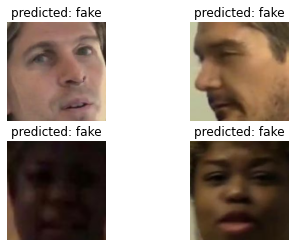

In [16]:
transform = transforms.Compose([transforms.Resize(299),
                                transforms.CenterCrop(299),
                                transforms.ToTensor()])

test_dataset = datasets.ImageFolder(
        './dataset/train',
        transform=transform)


test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=1)

class_names = test_dataset.classes
visualize_model(model, class_names)

In [12]:
#https://github.com/rakutentech/stAdv - refered code
def flow_st(images,flows):
  images_shape = images.size()
  flows_shape = flows.size()
  batch_size = images_shape[0]
  H = images_shape[2]
  W = images_shape[3]
  basegrid = torch.stack(torch.meshgrid(torch.arange(0,H), torch.arange(0,W))) #(2,H,W)
  sampling_grid = basegrid.unsqueeze(0).type(torch.float32).cuda() + flows.cuda()
  sampling_grid_x = torch.clamp(sampling_grid[:,1],0.0,W-1.0).type(torch.float32)
  sampling_grid_y = torch.clamp(sampling_grid[:,0],0.0,H-1.0).type(torch.float32)

  x0 = torch.floor(sampling_grid_x).type(torch.int64)
  x1 = x0 + 1
  y0 = torch.floor(sampling_grid_y).type(torch.int64)
  y1 = y0 + 1

  x0 = torch.clamp(x0, 0, W - 2)
  x1 = torch.clamp(x1, 0, W - 1)
  y0 = torch.clamp(y0, 0, H - 2)
  y1 = torch.clamp(y1, 0, H - 1)
  
  Ia = images[:,:,y0[0,:,:], x0[0,:,:]]
  Ib = images[:,:,y1[0,:,:], x0[0,:,:]]
  Ic = images[:,:,y0[0,:,:], x1[0,:,:]]
  Id = images[:,:,y1[0,:,:], x1[0,:,:]]

  x0 = x0.type(torch.float32)
  x1 = x1.type(torch.float32)
  y0 = y0.type(torch.float32)
  y1 = y1.type(torch.float32)
  
  wa = (x1 - sampling_grid_x) * (y1 - sampling_grid_y)
  wb = (x1 - sampling_grid_x) * (sampling_grid_y - y0)
  wc = (sampling_grid_x - x0) * (y1 - sampling_grid_y)
  wd = (sampling_grid_x - x0) * (sampling_grid_y - y0)
  
  perturbed_image = wa.unsqueeze(0)*Ia+wb.unsqueeze(0)*Ib+wc.unsqueeze(0)*Ic+wd.unsqueeze(0)*Id

  return perturbed_image.type(torch.float32).cuda()


def flow_loss(flows,padding_mode='constant', epsilon=1e-8):
  paddings = (1,1,1,1)
  padded_flows = F.pad(flows,paddings,mode=padding_mode,value=0)
  shifted_flows = [
    padded_flows[:, :, 2:, 2:],  # bottom right (+1,+1)
    padded_flows[:, :, 2:, :-2],  # bottom left (+1,-1)
    padded_flows[:, :, :-2, 2:],  # top right (-1,+1)
    padded_flows[:, :, :-2, :-2]  # top left (-1,-1)
  ]
  #||\Delta u^{(p)} - \Delta u^{(q)}||_2^2 + # ||\Delta v^{(p)} - \Delta v^{(q)}||_2^2 
  loss=0
  for shifted_flow in shifted_flows:
    loss += torch.sum(torch.square(flows[:, 1] - shifted_flow[:, 1]) + torch.square(flows[:, 0] - shifted_flow[:, 0]) + epsilon).cuda()
  return loss.type(torch.float32)

def adv_loss(logits,targets,confidence=0.0):
  confidence=torch.tensor(confidence).cuda()
  real = torch.sum(logits*targets,-1)
  other = torch.max((1-targets)*logits-(targets*10000),-1)[0]
  return torch.max(other-real,confidence)[0].type(torch.float32)

def func(flows,input,target,model,const=0.001):
  input = torch.from_numpy(input).cuda()
  target = torch.from_numpy(target).cuda()
  flows = torch.from_numpy(flows).view((1,2,)+input.size()[2:]).cuda()
  flows.requires_grad=True
  pert_out = flow_st(input,flows)
  output = model(pert_out)
  L_flow = flow_loss(flows)
  L_adv = adv_loss(output,target)
  L_final = L_adv+const*L_flow
  model.zero_grad()
  L_final.backward()
  gradient = flows.grad.data.view(-1).detach().cpu().numpy()
  return L_final.item(),gradient

def attack(input,target,model):
  init_flows = np.zeros((1,2,)+input.size()[2:]).reshape(-1)
  results = optimize.fmin_l_bfgs_b(func,init_flows,args=(input.cpu().numpy(),target.cpu().numpy(),model))
  if 'CONVERGENCE' in results[2]['task']:
    flows = torch.from_numpy(results[0]).view((1,2,)+input.size()[2:])
    pert_out = flow_st(input,flows)
  else:
    return None
  return pert_out

In [13]:
!pip install scipy

Looking in indexes: https://repo.huaweicloud.com/repository/pypi/simple


In [14]:
from scipy import optimize 
import torch.nn.functional as F

In [ ]:
import numpy as np
if __name__=='__main__':
    np.random.seed(42)
    torch.manual_seed(42)

#     transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (1.0,))])
    #   testset = datasets.MNIST(root = './data', train=False, transform = transform, download=True)
    test_loader = torch.utils.data.DataLoader(image_datasets['val'], batch_size=1,shuffle=True)
    # dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,shuffle=True, num_workers=4) for x in ['train', 'val']}
    use_cuda=True
    device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")
    model = Xception_Net().to(device) 
    model.load_state_dict(torch.load('model_xception_ffhq_100acc.pt'))
    model.eval()

    adv=[]
    pri = []
    adv_label=[]
    correct_label=[]
    sample=100
    success=0
    for i,data in enumerate(test_loader):
        if i<sample:
          input,label = data[0].to(device),data[1].to(device)
          random_target = np.random.choice([num for num in range(2) if num != label.item()])
          target = torch.from_numpy(np.expand_dims(np.eye(2, dtype=np.float32)[random_target],0)).cuda()
          pri.append(input.squeeze().detach().cpu().numpy())
          pert_out = attack(input,target,model)
          if pert_out!=None:
            output =  model(pert_out)
            adv.append(pert_out.squeeze().detach().cpu().numpy())
            correct_label.append(label.item())
            adv_label.append(torch.argmax(output).item())
            if label.item()!=torch.argmax(output).item():
              success+=1
        else:
          break

/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Success Rate: 3.8200 
96
0 -> 0


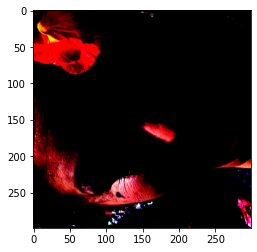

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


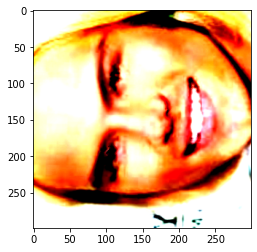

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 -> 1


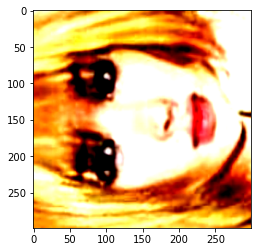

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


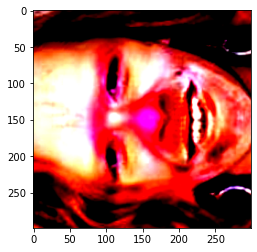

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1 -> 1


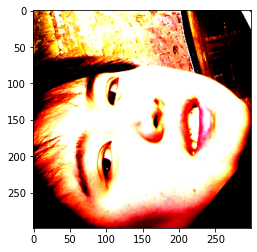

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


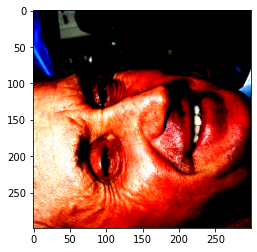

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1 -> 1


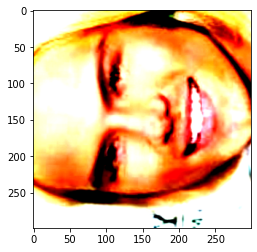

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


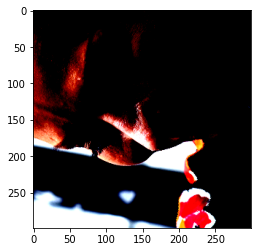

0 -> 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


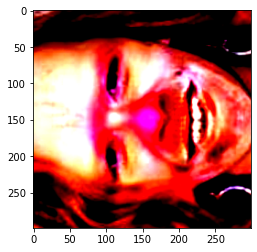

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


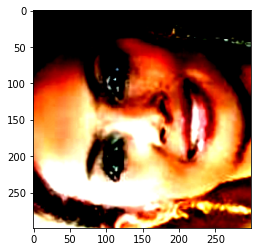

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 -> 1


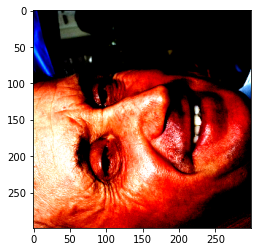

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


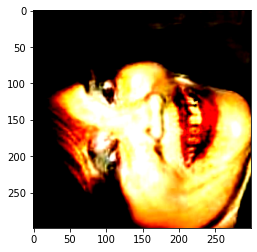

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 -> 1


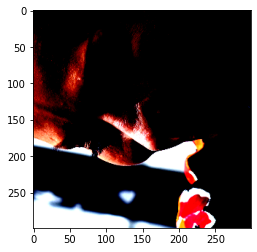

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


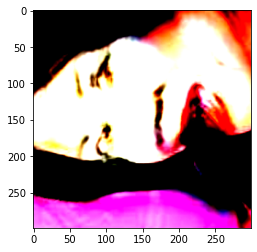

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 -> 1


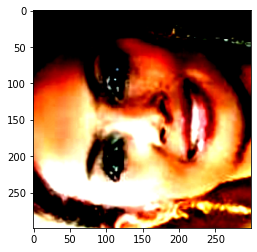

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


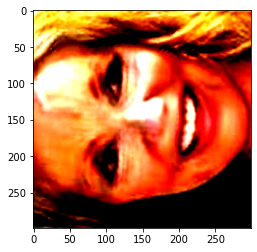

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 -> 0


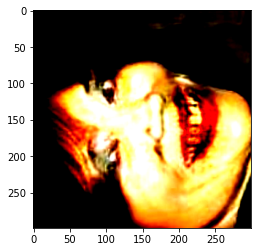

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


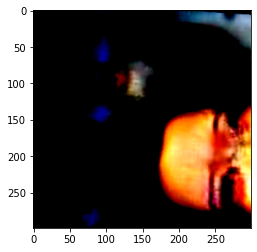

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 -> 1


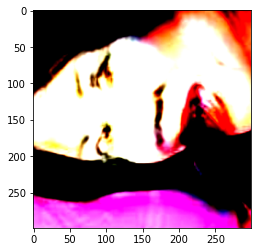

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


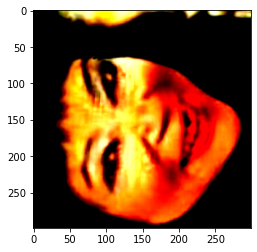

In [49]:
print("Success Rate: {:.4f} ".format(success/sample))
cnt = 0
# plt.figure(figsize=(299,2993))
print(len(adv))
for i in range(40):
    if i < 30:
        continue
    orig,adv_,adversarial,pristine = correct_label[i],adv_label[i],adv[i], pri[i]
    print("{} -> {}".format(orig, adv_))
    plt.imshow(pristine.T)
    plt.show()
    plt.imshow(adversarial.T)
    plt.show()

In [33]:
loss = nn.CrossEntropyLoss()
import torchvision.utils
from torchvision import models
import torchvision.datasets as dsets
import torchvision.transforms as transforms

In [43]:
def fgsm_attack(model, loss, images, labels, eps) :
    
    images = images.to(device)
    labels = labels.to(device)
    images.requires_grad = True
            
    outputs = model(images)
    
    model.zero_grad()
    cost = loss(outputs, labels).to(device)
    cost.backward()
    
    attack_images = images + eps*images.grad.sign()
    attack_images = torch.clamp(attack_images, 0, 1)
    
    return attack_images


def imshow(img, title):
    npimg = img.numpy()
    # fig = plt.figure(figsize = (5, 15))
    plt.imshow(np.transpose(npimg,(1,2,0)))
    plt.title(title)
    plt.show()

Attack Image & Predicted Label


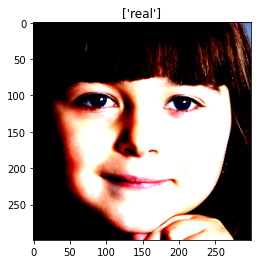

tensor([1], device='cuda:0')


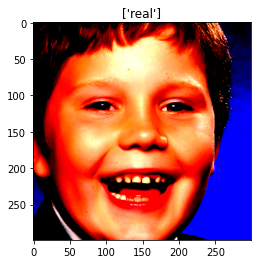

tensor([1], device='cuda:0')


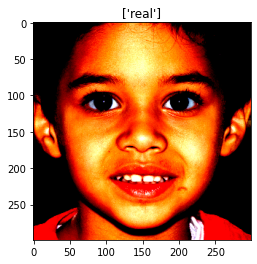

tensor([1], device='cuda:0')


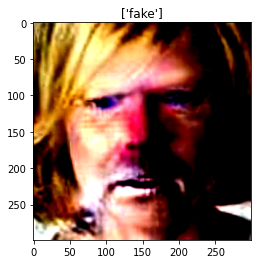

tensor([0], device='cuda:0')


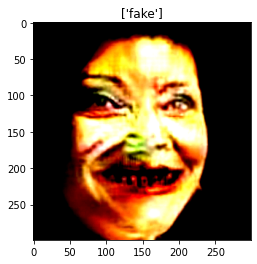

tensor([0], device='cuda:0')


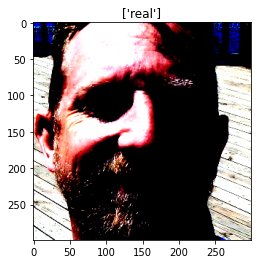

tensor([1], device='cuda:0')


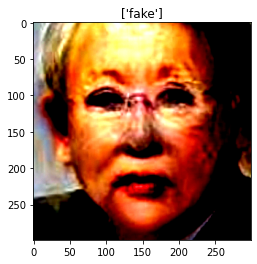

tensor([0], device='cuda:0')


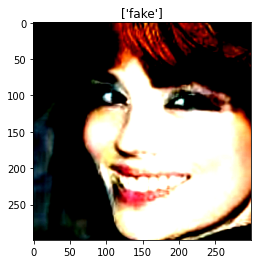

tensor([0], device='cuda:0')


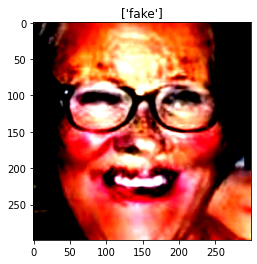

tensor([0], device='cuda:0')


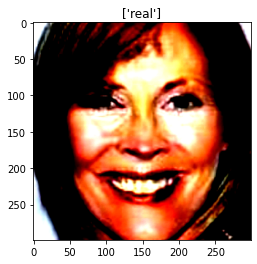

tensor([0], device='cuda:0')


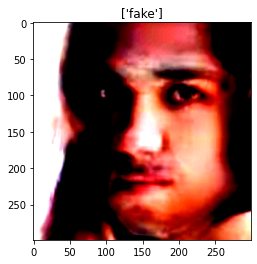

tensor([0], device='cuda:0')


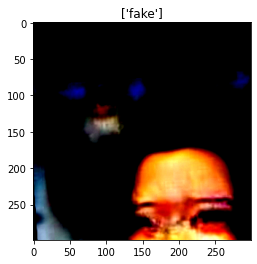

tensor([0], device='cuda:0')


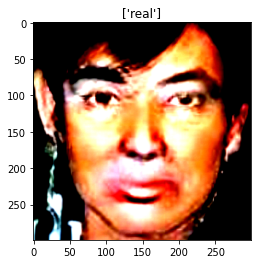

tensor([0], device='cuda:0')


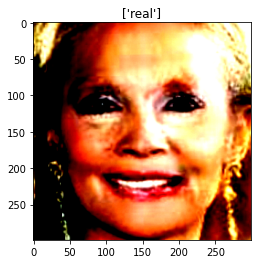

tensor([0], device='cuda:0')


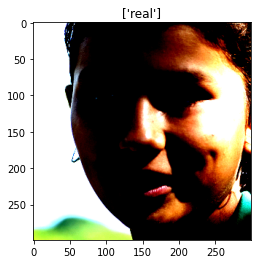

tensor([1], device='cuda:0')


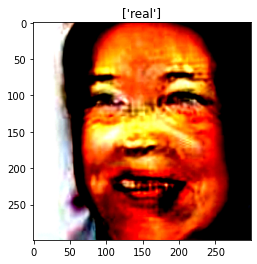

tensor([0], device='cuda:0')


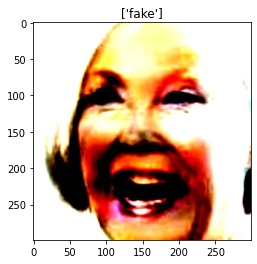

tensor([0], device='cuda:0')


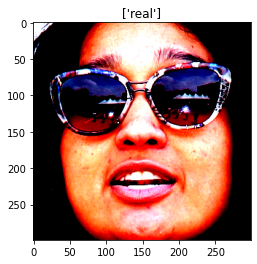

tensor([1], device='cuda:0')


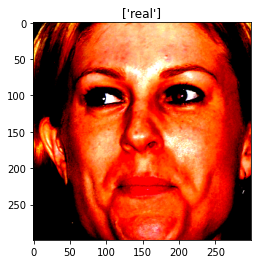

tensor([1], device='cuda:0')


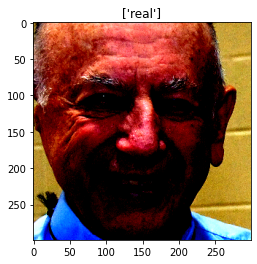

tensor([1], device='cuda:0')


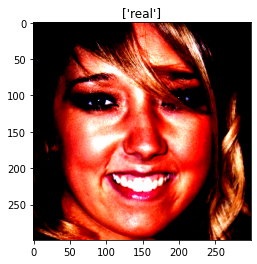

tensor([1], device='cuda:0')


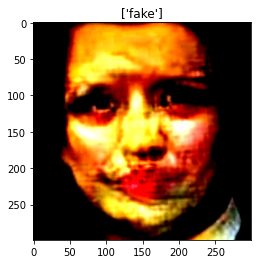

tensor([0], device='cuda:0')


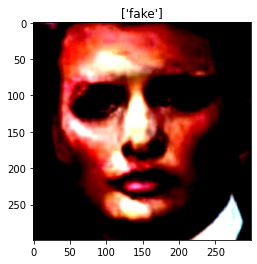

tensor([0], device='cuda:0')


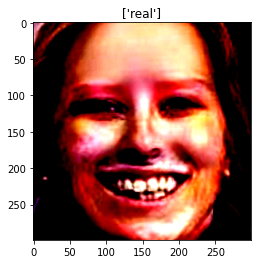

tensor([0], device='cuda:0')


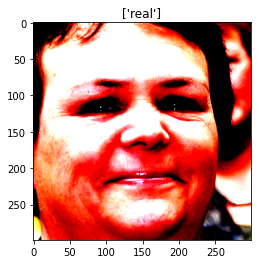

tensor([1], device='cuda:0')


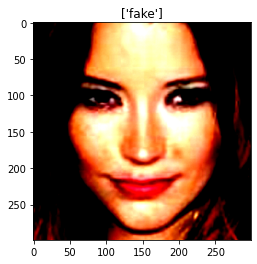

tensor([0], device='cuda:0')


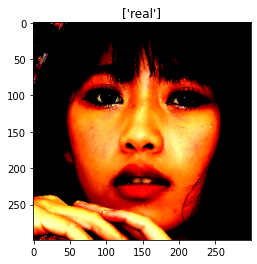

tensor([1], device='cuda:0')


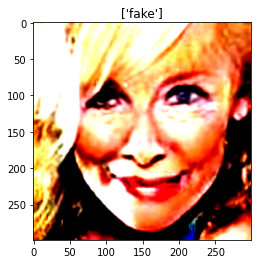

tensor([0], device='cuda:0')


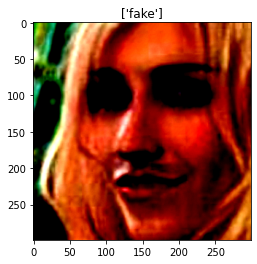

tensor([0], device='cuda:0')


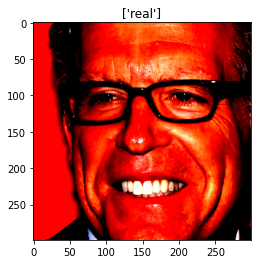

tensor([1], device='cuda:0')


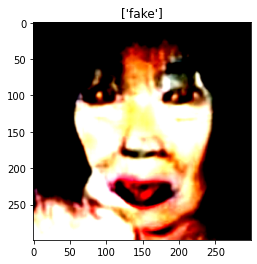

tensor([0], device='cuda:0')


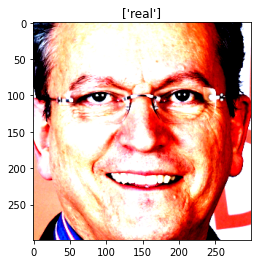

tensor([1], device='cuda:0')


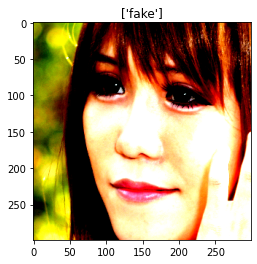

tensor([1], device='cuda:0')


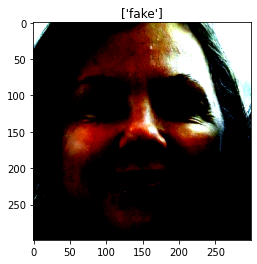

tensor([1], device='cuda:0')


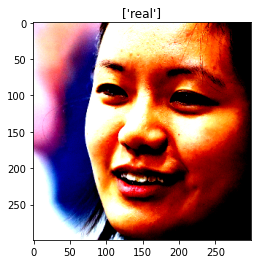

tensor([1], device='cuda:0')


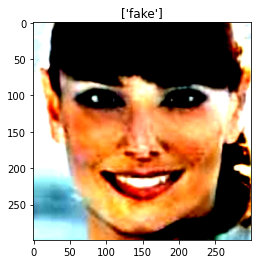

tensor([0], device='cuda:0')


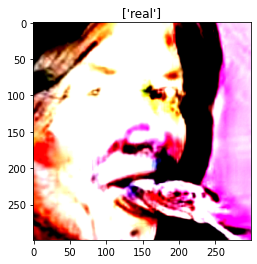

tensor([0], device='cuda:0')


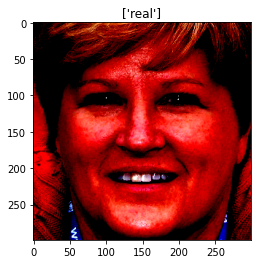

tensor([1], device='cuda:0')


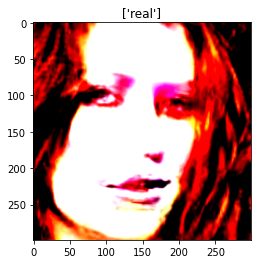

tensor([0], device='cuda:0')


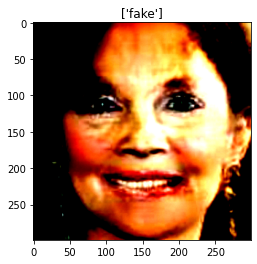

tensor([0], device='cuda:0')


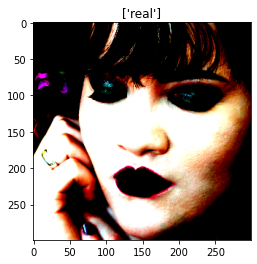

tensor([1], device='cuda:0')


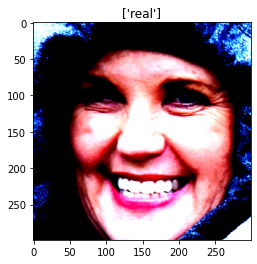

tensor([1], device='cuda:0')


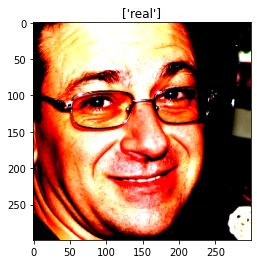

tensor([1], device='cuda:0')


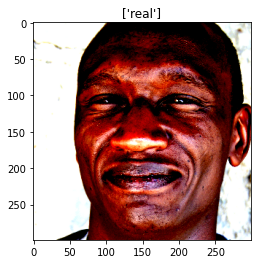

tensor([1], device='cuda:0')


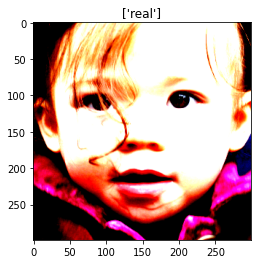

tensor([1], device='cuda:0')


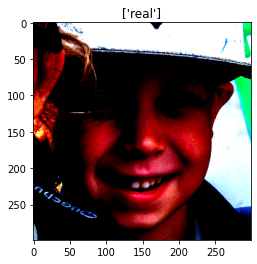

tensor([1], device='cuda:0')


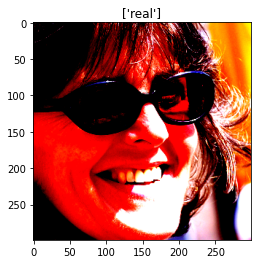

tensor([1], device='cuda:0')


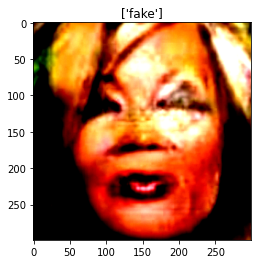

tensor([0], device='cuda:0')


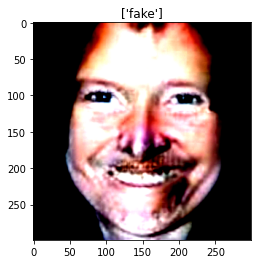

tensor([0], device='cuda:0')


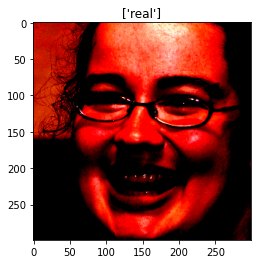

tensor([1], device='cuda:0')


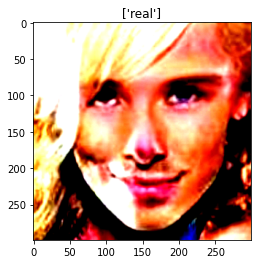

tensor([0], device='cuda:0')


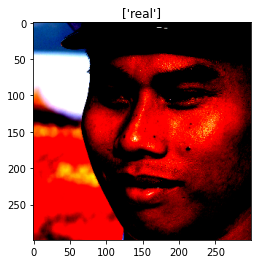

tensor([1], device='cuda:0')


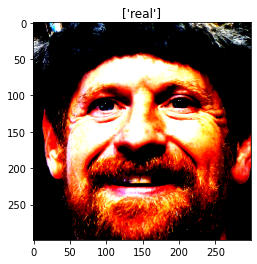

tensor([1], device='cuda:0')


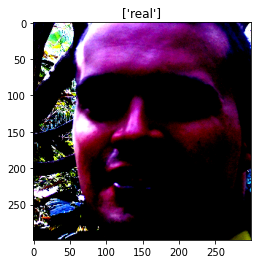

tensor([1], device='cuda:0')


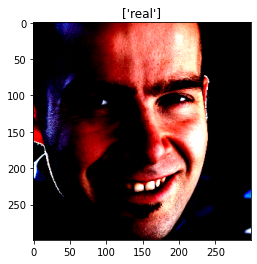

tensor([1], device='cuda:0')


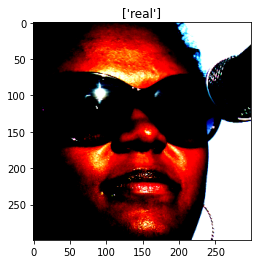

tensor([1], device='cuda:0')


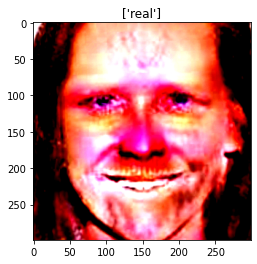

tensor([0], device='cuda:0')


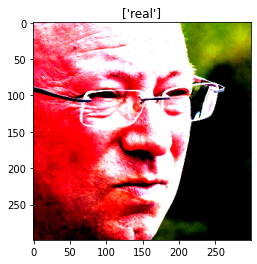

tensor([1], device='cuda:0')


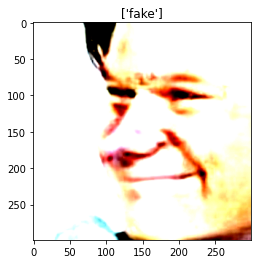

tensor([0], device='cuda:0')


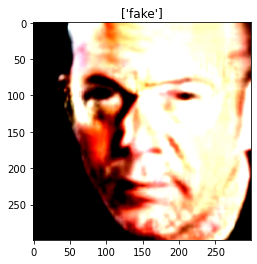

tensor([0], device='cuda:0')


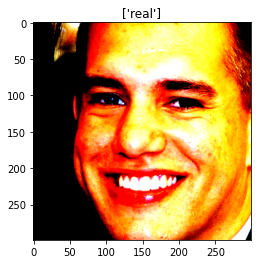

tensor([1], device='cuda:0')


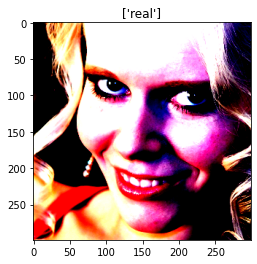

tensor([1], device='cuda:0')


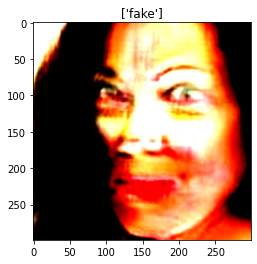

tensor([0], device='cuda:0')


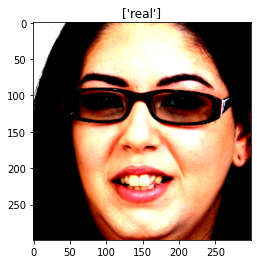

tensor([1], device='cuda:0')


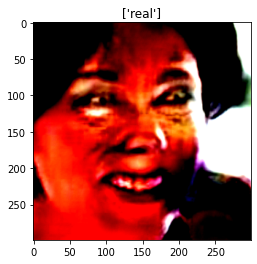

tensor([0], device='cuda:0')


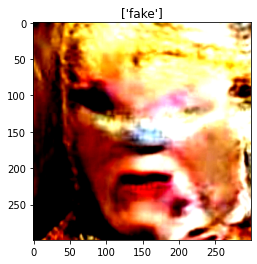

tensor([0], device='cuda:0')


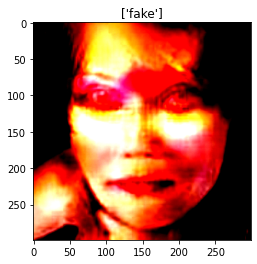

tensor([0], device='cuda:0')


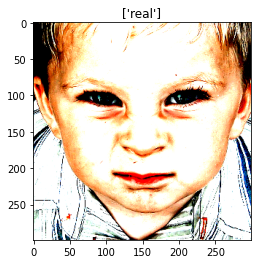

tensor([1], device='cuda:0')


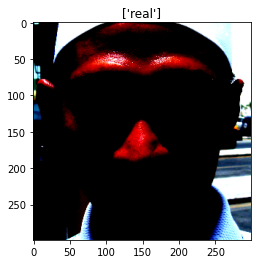

tensor([1], device='cuda:0')


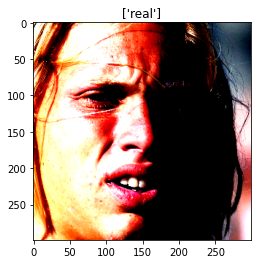

tensor([1], device='cuda:0')


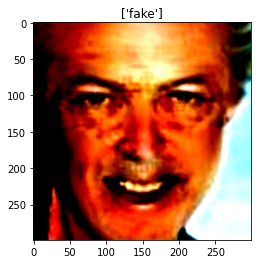

tensor([0], device='cuda:0')


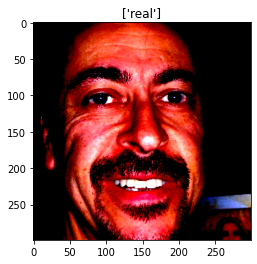

tensor([1], device='cuda:0')


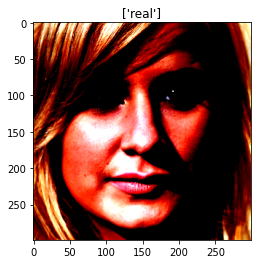

tensor([1], device='cuda:0')


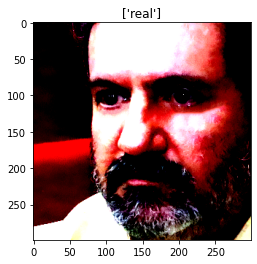

tensor([1], device='cuda:0')


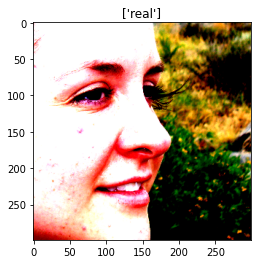

tensor([1], device='cuda:0')


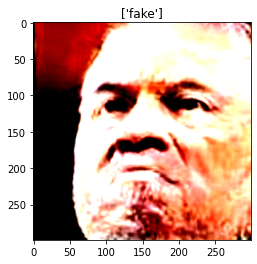

tensor([0], device='cuda:0')


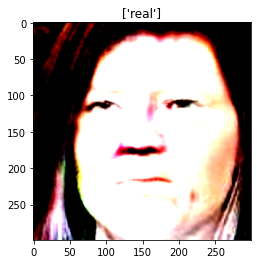

tensor([0], device='cuda:0')


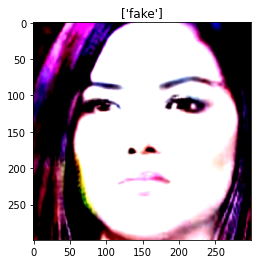

tensor([0], device='cuda:0')


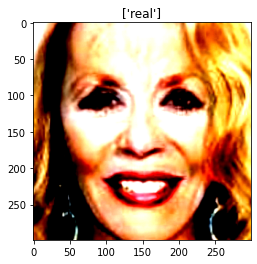

tensor([0], device='cuda:0')


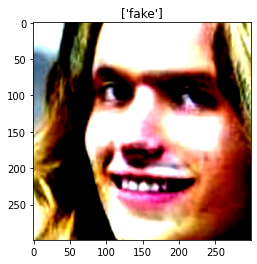

tensor([0], device='cuda:0')


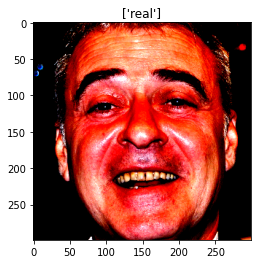

tensor([1], device='cuda:0')


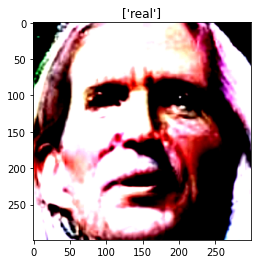

tensor([0], device='cuda:0')


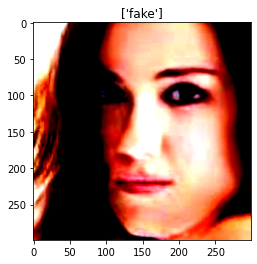

tensor([0], device='cuda:0')


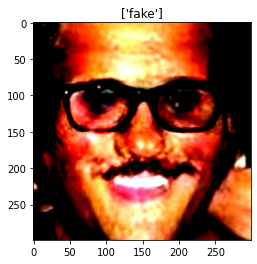

tensor([0], device='cuda:0')


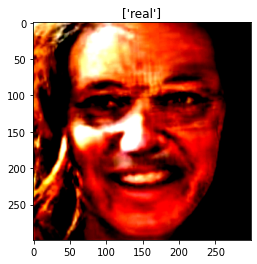

tensor([0], device='cuda:0')


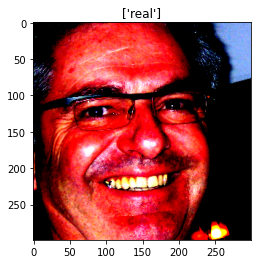

tensor([1], device='cuda:0')


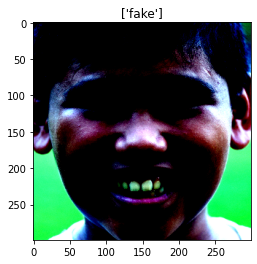

tensor([1], device='cuda:0')


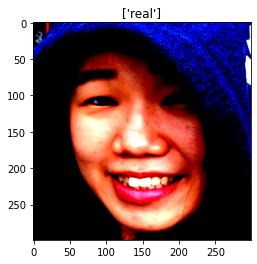

tensor([1], device='cuda:0')


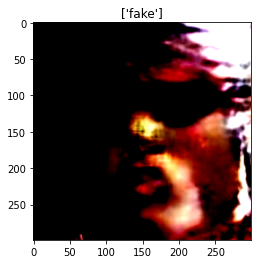

tensor([0], device='cuda:0')


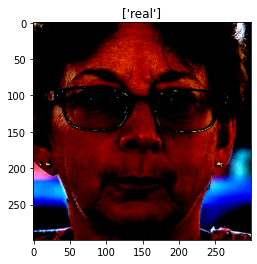

tensor([1], device='cuda:0')


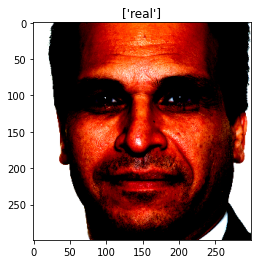

tensor([1], device='cuda:0')


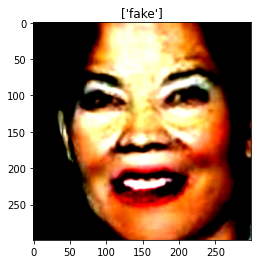

tensor([0], device='cuda:0')


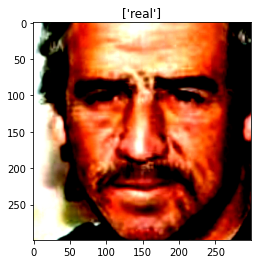

tensor([0], device='cuda:0')


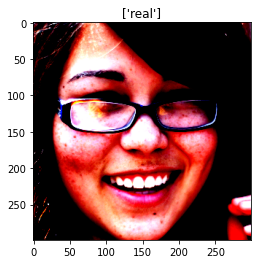

tensor([1], device='cuda:0')


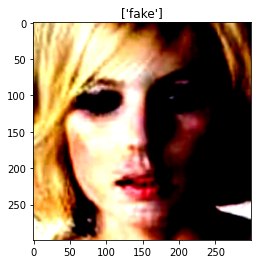

tensor([0], device='cuda:0')


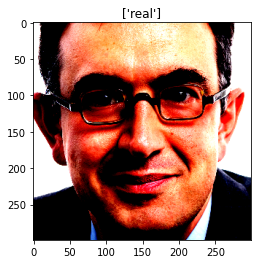

tensor([1], device='cuda:0')


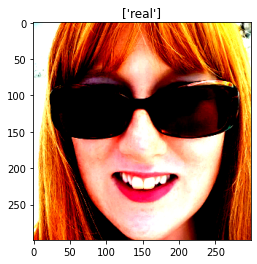

tensor([1], device='cuda:0')


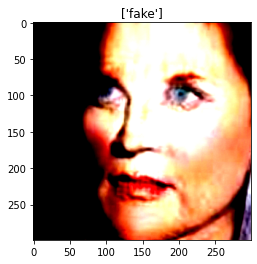

tensor([0], device='cuda:0')


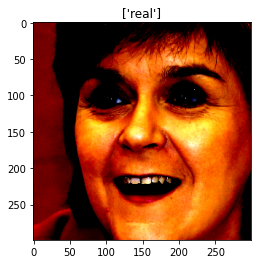

tensor([1], device='cuda:0')


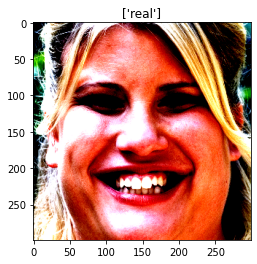

tensor([1], device='cuda:0')


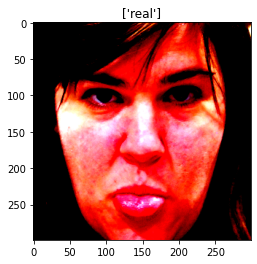

tensor([1], device='cuda:0')


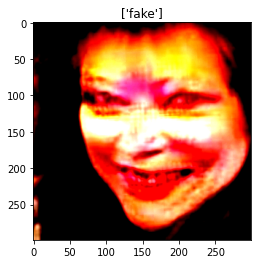

tensor([0], device='cuda:0')


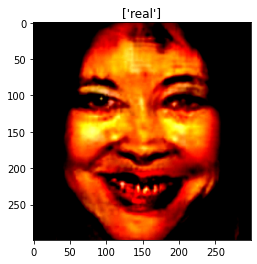

tensor([0], device='cuda:0')


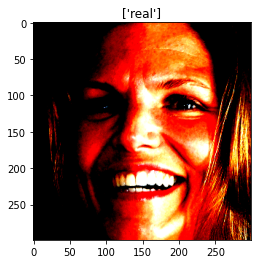

tensor([1], device='cuda:0')


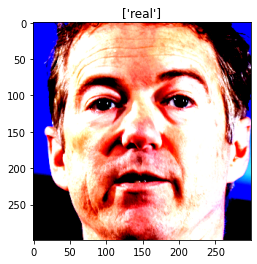

tensor([1], device='cuda:0')


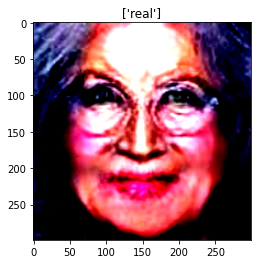

tensor([0], device='cuda:0')


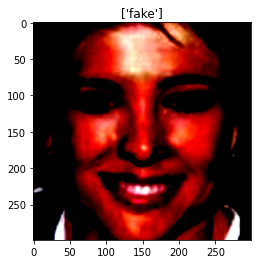

tensor([0], device='cuda:0')


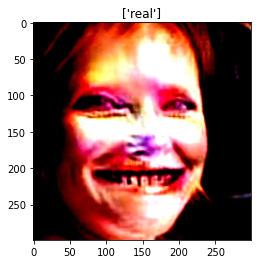

tensor([0], device='cuda:0')


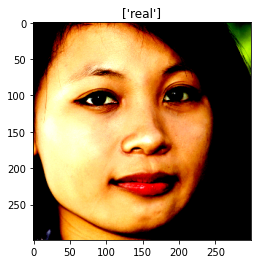

tensor([1], device='cuda:0')


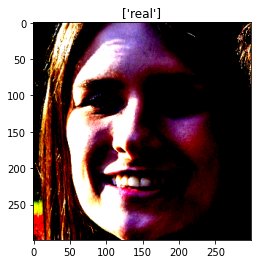

tensor([1], device='cuda:0')


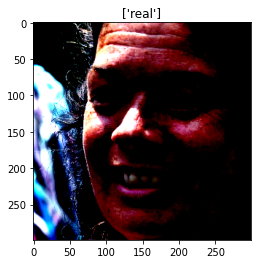

tensor([1], device='cuda:0')


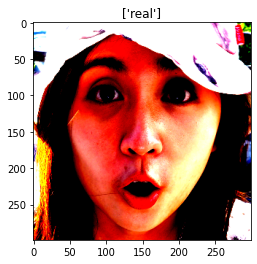

tensor([1], device='cuda:0')


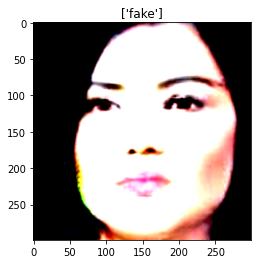

tensor([0], device='cuda:0')


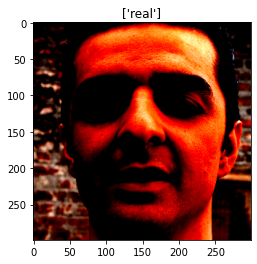

tensor([1], device='cuda:0')


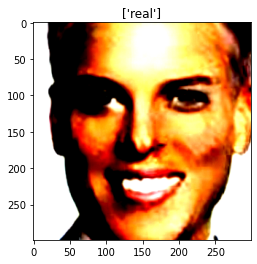

tensor([0], device='cuda:0')


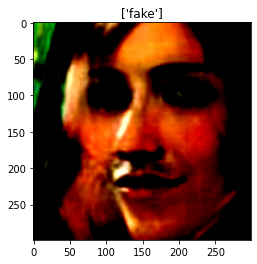

tensor([0], device='cuda:0')


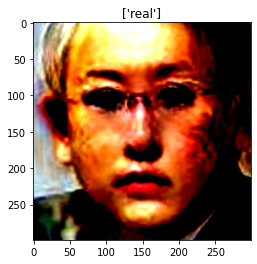

tensor([0], device='cuda:0')


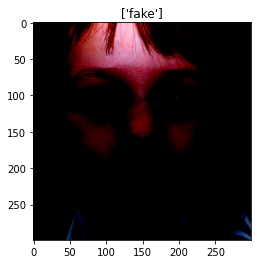

tensor([1], device='cuda:0')


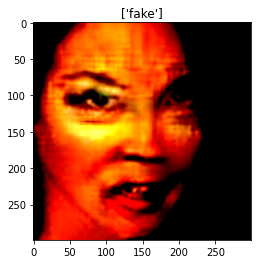

tensor([0], device='cuda:0')


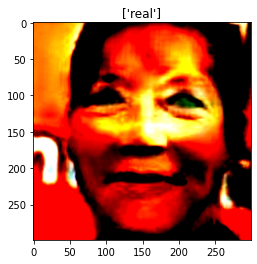

tensor([0], device='cuda:0')


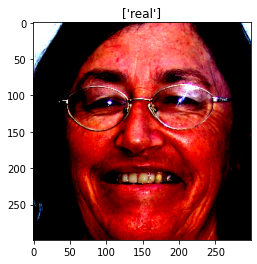

tensor([1], device='cuda:0')


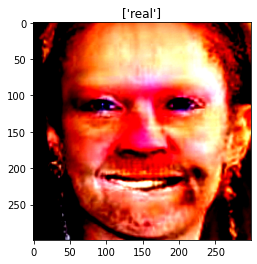

tensor([0], device='cuda:0')


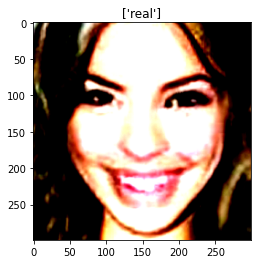

tensor([0], device='cuda:0')


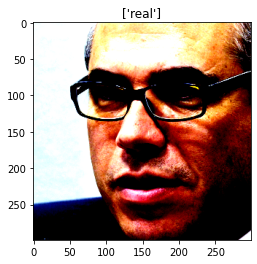

tensor([1], device='cuda:0')


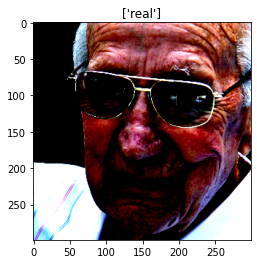

tensor([1], device='cuda:0')


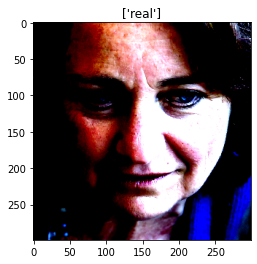

tensor([1], device='cuda:0')


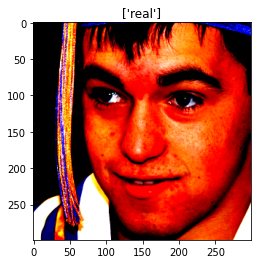

tensor([1], device='cuda:0')


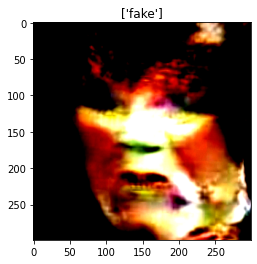

tensor([0], device='cuda:0')


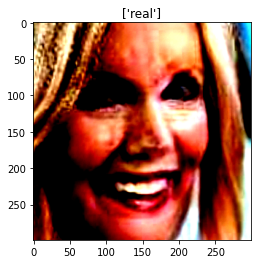

tensor([0], device='cuda:0')


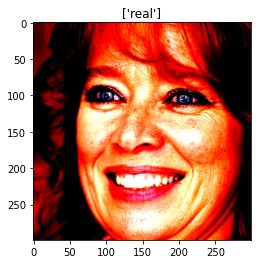

tensor([1], device='cuda:0')


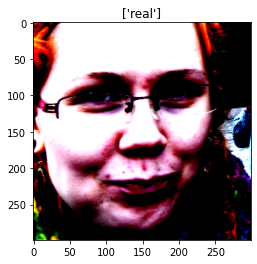

tensor([1], device='cuda:0')


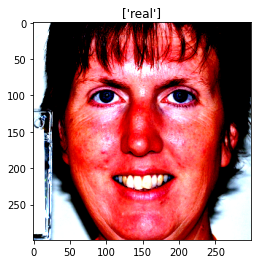

tensor([1], device='cuda:0')


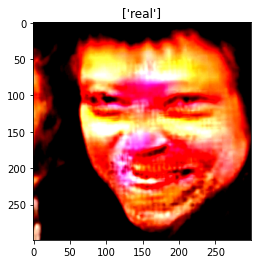

tensor([0], device='cuda:0')


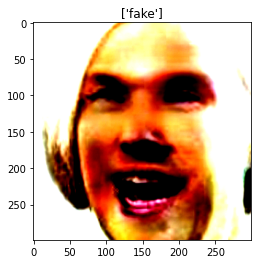

tensor([0], device='cuda:0')


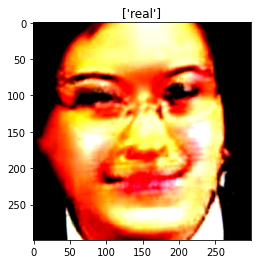

tensor([0], device='cuda:0')


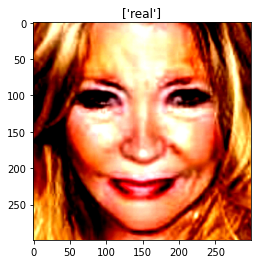

tensor([0], device='cuda:0')


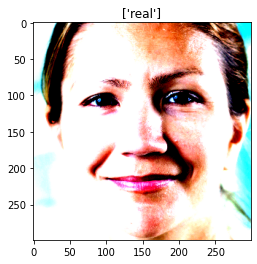

tensor([1], device='cuda:0')


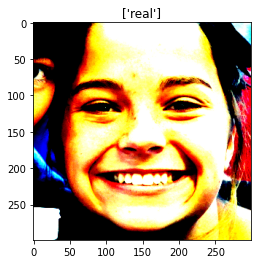

tensor([1], device='cuda:0')


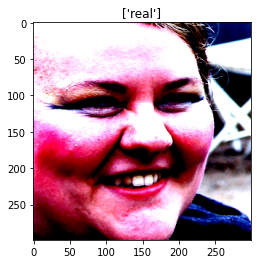

tensor([1], device='cuda:0')


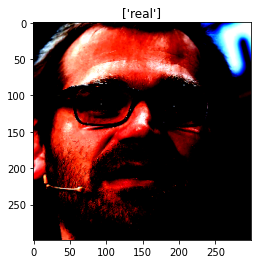

tensor([1], device='cuda:0')


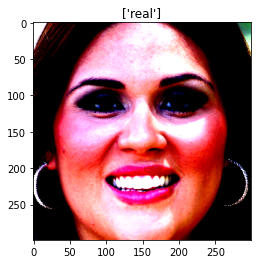

tensor([1], device='cuda:0')


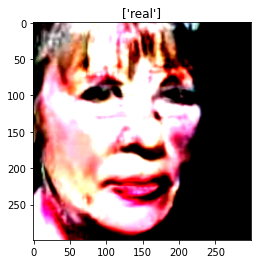

tensor([0], device='cuda:0')


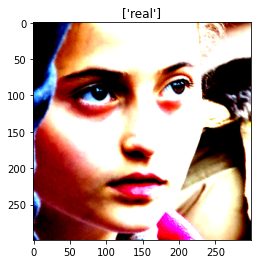

tensor([1], device='cuda:0')


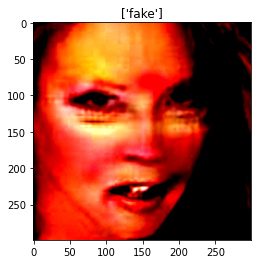

tensor([0], device='cuda:0')


In [ ]:
print("Attack Image & Predicted Label")

model.eval()

correct = 0
total = 0
success = 0
for images, labels in test_loader:
    
    images = fgsm_attack(model, loss, images, labels, 0.007).to(device)
    labels = labels.to(device)
    outputs = model(images)
    
    _, pre = torch.max(outputs.data, 1)
    
    total += 1
    correct += (pre == labels).sum()
    
    if labels.item()!=torch.argmax(outputs).item():
        success+=1
    
    imshow(torchvision.utils.make_grid(images.cpu().data, normalize=True), [image_datasets['val'].classes[i] for i in pre])
    print(labels)
    
# print('Accuracy of test text: %f %%' % (100 * float(correct) / total))
# print('Success Rate: %f %%' % (100 * float(success) / total))

In [41]:
def pgd_attack(model, images, labels, eps=0.3, alpha=2/255, iters=40) :
    images = images.to(device)
    labels = labels.to(device)
    loss = nn.CrossEntropyLoss()
        
    ori_images = images.data
        
    for i in range(iters) :    
        images.requires_grad = True
        outputs = model(images)

        model.zero_grad()
        cost = loss(outputs, labels).to(device)
        cost.backward()

        adv_images = images + alpha*images.grad.sign()
        eta = torch.clamp(adv_images - ori_images, min=-eps, max=eps)
        images = torch.clamp(ori_images + eta, min=0, max=1).detach_()
            
    return images

In [42]:
print("Attack Image & Predicted Label")

model.eval()

correct = 0
total = 0

for images, labels in test_loader:
    
    images = pgd_attack(model, images, labels)
    labels = labels.to(device)
    outputs = model(images)
    
    _, pre = torch.max(outputs.data, 1)

    total += 1
    correct += (pre == labels).sum()
    
    # imshow(torchvision.utils.make_grid(images.cpu().data, normalize=True), [normal_data.classes[i] for i in pre])
    
print('Accuracy of test text: %f %%' % (100 * float(correct) / total))

Attack Image & Predicted Label
Accuracy of test text: 0.555899 %
